In [1]:
from google.colab import drive
drive.mount('/gdrive')

from pathlib import Path

repo = Path("/gdrive/My Drive/Proyecto EL-7006/Repositorio Paper 1")

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).


In [2]:
%cd {repo}
%ls

/gdrive/.shortcut-targets-by-id/1oVtjXutXwBNZoRLREyCKBqVdXcJig9g_/Proyecto/Repositorio Paper 1
causal/       __init__.py  README.md         run.py
causal_meta/  notebooks/   requirements.txt


In [3]:
import sys
# sys.path.insert(0, '../..')
biv_cont_mult_path = repo / "notebooks" / 'bivariate-continuous-multimodal'
biv_cat_path = repo / "notebooks" / 'bivariate-categorical'
sys.path.insert(1, str(repo))

In [4]:
!python -m pip install -r "{repo / 'requirements.txt'}"

     |████████████████████████████████| 591.8MB 25kB/s 
ERROR: torchvision 0.7.0+cu101 has requirement torch==1.6.0, but you'll have torch 1.0.0 which is incompatible.
  Found existing installation: torch 1.6.0+cu101
    Uninstalling torch-1.6.0+cu101:
      Successfully uninstalled torch-1.6.0+cu101


## Experimentos Bivariate-Categorical

In [5]:
sys.path.insert(1, str(biv_cat_path))
if str(biv_cont_mult_path) in sys.path:
    sys.path.remove(str(biv_cont_mult_path))

In [5]:
%matplotlib inline
%cd {biv_cat_path}

import numpy as np
import torch
import matplotlib.pyplot as plt

from tqdm import tnrange, tqdm_notebook
from causal_meta.utils.data_utils import generate_data_categorical
from models import StructuralModel

/gdrive/.shortcut-targets-by-id/1oVtjXutXwBNZoRLREyCKBqVdXcJig9g_/Proyecto/Repositorio Paper 1/notebooks/bivariate-categorical


### Experimento 1: Generalización misma distribución

In [31]:
N = 10
num_runs = 1 # 100
num_epochs = 1000
batch_size = 100
num_test = 100000

In [32]:
train_losses = np.zeros((2, num_runs, num_epochs))
val_losses = np.zeros((2, num_runs, num_epochs))

for j in tnrange(num_runs):
    pi_A = np.random.dirichlet(np.ones(N))
    pi_B_A = np.random.dirichlet(np.ones(N), size=(N,))
    validation_set = torch.from_numpy(generate_data_categorical(num_test, pi_A, pi_B_A))
    
    model = StructuralModel(N, dtype=torch.float64)
    optimizer = torch.optim.RMSprop(model.modules_parameters(), lr=1e-2)
    for i in tnrange(num_epochs, leave=False):
        with torch.no_grad():
            val_loss_A_B = -torch.mean(model.model_A_B(validation_set))
            val_loss_B_A = -torch.mean(model.model_B_A(validation_set))
            val_losses[:, j, i] = [val_loss_A_B.item(), val_loss_B_A.item()]
        optimizer.zero_grad()
        inputs = torch.from_numpy(generate_data_categorical(batch_size, pi_A, pi_B_A))
        loss_A_B = -torch.mean(model.model_A_B(inputs))
        loss_B_A = -torch.mean(model.model_B_A(inputs))
        train_losses[:, j, i] = [loss_A_B.item(), loss_B_A.item()]
        loss = loss_A_B + loss_B_A
        loss.backward()
        optimizer.step()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  after removing the cwd from sys.path.


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  # This is added back by InteractiveShellApp.init_path()


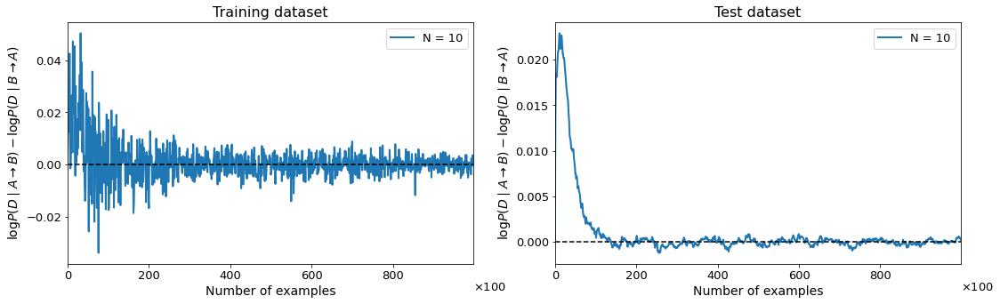

In [33]:
plt.figure(figsize=(18, 5))

ax1 = plt.subplot2grid((1, 2), (0, 0))
train_diffs = train_losses[1] - train_losses[0]
train_diffs_25, train_diffs_50, train_diffs_75 = np.percentile(train_diffs, (25, 50, 75), axis=0)
ax1.plot(train_diffs_50, 'k-', label='N = {0}'.format(N), lw=2, color='C0')
ax1.fill_between(np.arange(num_epochs), train_diffs_25, train_diffs_75, color='C0', alpha=0.2)
ax1.set_title('Training dataset', fontsize=16)

ax2 = plt.subplot2grid((1, 2), (0, 1))
val_diffs = val_losses[1] - val_losses[0]
val_diffs_25, val_diffs_50, val_diffs_75 = np.percentile(val_diffs, (25, 50, 75), axis=0)
ax2.plot(val_diffs_50, 'k-', label='N = {0}'.format(N), lw=2, color='C0')
ax2.fill_between(np.arange(num_epochs), val_diffs_25, val_diffs_75, color='C0', alpha=0.2)
ax2.set_title('Test dataset', fontsize=16)

for ax in [ax1, ax2]:
    ax.axhline(0, color='k', ls='--')
    ax.tick_params(axis='both', which='major', labelsize=13)
    ax.set_xlabel('Number of examples', fontsize=14)
    ax.set_ylabel(r'$\log P(D\mid A \rightarrow B) - \log P(D\mid B \rightarrow A)$', fontsize=14)
    ax.set_xlim([0, 999])
    ax.legend(prop={'size': 13})
    ax.text(1., -0.12, r'$\times 100$',
        verticalalignment='bottom', horizontalalignment='left',
        transform=ax.transAxes, color='k', fontsize=13)

plt.show()

### Experimento 2: Adaptación en distribución de transferencia

In [15]:
N = 10
model = StructuralModel(N, dtype=torch.float64)

In [16]:
num_episodes = 500
batch_size = 100 # 1
num_test = 10000
num_training = 10 # 100
num_transfers = 10 # 100

In [17]:
optimizer = torch.optim.SGD(model.modules_parameters(), lr=1.)

In [18]:
losses = np.zeros((2, num_training, num_transfers, num_episodes))

for k in tnrange(num_training):
    pi_A_1 = np.random.dirichlet(np.ones(N))
    pi_B_A = np.random.dirichlet(np.ones(N), size=N)
    for j in tnrange(num_transfers, leave=False):
        model.set_ground_truth(pi_A_1, pi_B_A)
        pi_A_2 = np.random.dirichlet(np.ones(N))
        x_val = torch.from_numpy(generate_data_categorical(num_test, pi_A_2, pi_B_A))
        for i in range(num_episodes):
            x_transfer = torch.from_numpy(generate_data_categorical(batch_size, pi_A_2, pi_B_A))
            model.zero_grad()
            loss_A_B = -torch.mean(model.model_A_B(x_transfer))
            loss_B_A = -torch.mean(model.model_B_A(x_transfer))
            loss = loss_A_B + loss_B_A
            
            with torch.no_grad():
                val_loss_A_B = -torch.mean(model.model_A_B(x_val))
                val_loss_B_A = -torch.mean(model.model_B_A(x_val))

            losses[:, k, j, i] = [val_loss_A_B.item(), val_loss_B_A.item()]

            loss.backward()
            optimizer.step()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  This is separate from the ipykernel package so we can avoid doing imports until


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  


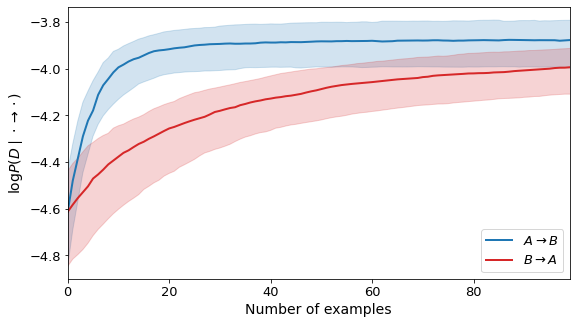

In [19]:
flat_losses = -losses.reshape((2, -1, num_episodes))
losses_25, losses_50, losses_75 = np.percentile(flat_losses, (25, 50, 75), axis=1)

plt.figure(figsize=(9, 5))

ax = plt.subplot(1, 1, 1)
ax.plot(losses_50[0], color='C0', label=r'$A \rightarrow B$', lw=2)
ax.fill_between(np.arange(num_episodes), losses_25[0], losses_75[0], color='C0', alpha=0.2)
ax.plot(losses_50[1], color='C3', label=r'$B \rightarrow A$', lw=2)
ax.fill_between(np.arange(num_episodes), losses_25[1], losses_75[1], color='C3', alpha=0.2)
ax.set_xlim([0, flat_losses.shape[1] - 1])
ax.tick_params(axis='both', which='major', labelsize=13)
ax.legend(loc=4, prop={'size': 13})
ax.set_xlabel('Number of examples', fontsize=14)
ax.set_ylabel(r'$\log P(D\mid \cdot \rightarrow \cdot)$', fontsize=14)

plt.show()

### Experimento 3: Meta learning

In [10]:
N = 10
model = StructuralModel(N, dtype=torch.float64)

In [11]:
optimizer = torch.optim.SGD(model.modules_parameters(), lr=1e-1)
meta_optimizer = torch.optim.RMSprop([model.w], lr=1e-2)

In [12]:
num_runs = 1 # 10
num_training = 1 # 100
num_transfer = 1000
num_gradient_steps = 2

train_batch_size = 1000
transfer_batch_size = 10

In [13]:
alphas = np.zeros((num_runs, num_training, num_transfer))


for j in tnrange(num_runs):
    model.w.data.zero_()
    for i in tnrange(num_training, leave=False):
        # Step 1: Sample a joint distribution before intervention
        pi_A_1 = np.random.dirichlet(np.ones(N))
        pi_B_A = np.random.dirichlet(np.ones(N), size=N)
        
        transfers = tnrange(num_transfer, leave=False)
        for k in transfers:
            # Step 2: Train the modules on the training distribution
            model.set_ground_truth(pi_A_1, pi_B_A)
            # Step 3: Sample a joint distribution after intervention
            pi_A_2 = np.random.dirichlet(np.ones(N))

            # Step 4: Do k steps of gradient descent for adaptation on the
            # distribution after intervention
            model.zero_grad()
            loss = torch.tensor(0., dtype=torch.float64)
            for _ in range(num_gradient_steps):
                x_train = torch.from_numpy(generate_data_categorical(transfer_batch_size, pi_A_2, pi_B_A))
                loss += -torch.mean(model(x_train))
                optimizer.zero_grad()
                inner_loss_A_B = -torch.mean(model.model_A_B(x_train))
                inner_loss_B_A = -torch.mean(model.model_B_A(x_train))
                inner_loss = inner_loss_A_B + inner_loss_B_A
                inner_loss.backward()
                optimizer.step()

            # Step 5: Update the structural parameter alpha
            meta_optimizer.zero_grad()
            loss.backward()
            meta_optimizer.step()

            # Log the values of alpha
            alpha = torch.sigmoid(model.w).item()
            alphas[j, i, k] = alpha
            transfers.set_postfix(alpha='{0:.4f}'.format(alpha), grad='{0:.4f}'.format(model.w.grad.item()))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  after removing the cwd from sys.path.


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  # This is added back by InteractiveShellApp.init_path()


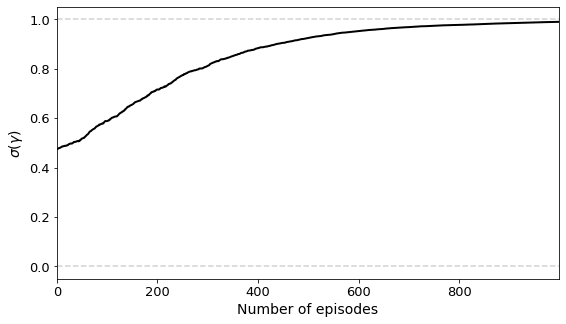

In [14]:
alphas_50 = np.percentile(alphas.reshape((-1, num_transfer)), 50, axis=0)

fig = plt.figure(figsize=(9, 5))
ax = plt.subplot(1, 1, 1)

ax.tick_params(axis='both', which='major', labelsize=13)
ax.axhline(1, c='lightgray', ls='--')
ax.axhline(0, c='lightgray', ls='--')
ax.plot(alphas_50, lw=2, color='k')

ax.set_xlim([0, num_transfer - 1])
ax.set_xlabel('Number of episodes', fontsize=14)
ax.set_ylabel(r'$\sigma(\gamma)$', fontsize=14)

plt.show()

## Experimentos Bivariate-continuous-multimodal

In [5]:
sys.path.insert(1, str(biv_cont_mult_path))
if str(biv_cat_path) in sys.path:
    sys.path.remove(str(biv_cat_path))

In [6]:
%matplotlib inline
%cd {biv_cont_mult_path}

import numpy as np
import torch
import matplotlib.pyplot as plt

from causal_meta.utils.data_utils import RandomSplineSCM
from causal_meta.modules.mdn import mdn_nll
from causal_meta.utils.train_utils import train_nll, make_alpha, train_alpha
from models import mdn, gmm, auc_transfer_metric
from argparse import Namespace

/gdrive/.shortcut-targets-by-id/1oVtjXutXwBNZoRLREyCKBqVdXcJig9g_/Proyecto/Repositorio Paper 1/notebooks/bivariate-continuous-multimodal


### Experimento 1: Generación de datos

In [6]:
scm = RandomSplineSCM(input_noise=False, output_noise=True,
    span=8., num_anchors=8, order=2, range_scale=1.)
num_points = 1000

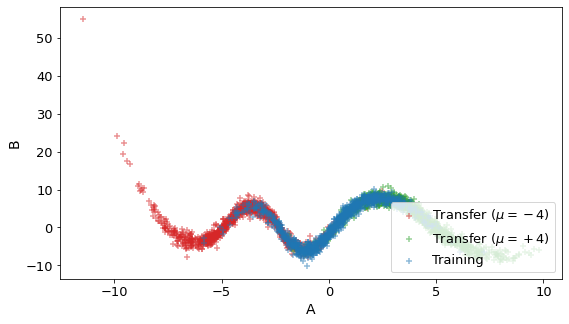

In [7]:
plt.figure(figsize=(9, 5))
ax = plt.subplot(1, 1, 1)
mus = [-4., 4., 0]
colors = ['C3', 'C2', 'C0']
labels = [r'Transfer ($\mu = -4$)', r'Transfer ($\mu = +4$)', 'Training']

for mu, color, label in zip(mus, colors, labels):
    X = mu + 2 * torch.randn((1000, 1))
    ax.scatter(X.squeeze(1).numpy(), scm(X).squeeze(1).numpy(), color=color, marker='+', alpha=0.5, label=label)

ax.tick_params(axis='both', which='major', labelsize=13)
ax.legend(loc=4, prop={'size': 13})
ax.set_xlabel('A', fontsize=14)
ax.set_ylabel('B', fontsize=14)

plt.show()

### Experimento 2: Meta learning

In [8]:
def normal(mean, std, N): 
    return torch.normal(torch.ones(N).mul_(mean), torch.ones(N).mul_(std)).view(-1, 1)

In [9]:
opt = Namespace()
# Model
opt.CAPACITY = 32
opt.NUM_COMPONENTS = 10
opt.GMM_NUM_COMPONENTS = 10
# Training
opt.LR = 0.001
opt.NUM_ITER = 3000
opt.CUDA = False
opt.REC_FREQ = 10
# Meta
opt.ALPHA_LR = 0.1
opt.ALPHA_NUM_ITER = 500
opt.FINETUNE_LR = 0.001
opt.FINETUNE_NUM_ITER = 10
opt.PARAM_DISTRY = lambda mean: normal(mean, 2, opt.NUM_SAMPLES)
opt.PARAM_SAMPLER = lambda: np.random.uniform(-4, 4)
# Sampling 
opt.NUM_SAMPLES = 1000
opt.TRAIN_DISTRY = lambda: normal(0, 2, opt.NUM_SAMPLES)
opt.TRANS_DISTRY = lambda: normal(random.randint(-4, 4), 2, opt.NUM_SAMPLES)

In [10]:
scm = RandomSplineSCM(False, True, 8, 10, 3, range_scale=1.)

In [11]:
model_x2y = mdn(opt)
frames_x2y = train_nll(opt, model_x2y, scm, opt.TRAIN_DISTRY, polarity='X2Y',
    loss_fn=mdn_nll, decoder=None, encoder=None)

In [12]:
model_y2x = mdn(opt)
frames_y2x = train_nll(opt, model_y2x, scm, opt.TRAIN_DISTRY, polarity='Y2X',
    loss_fn=mdn_nll, decoder=None, encoder=None)

In [13]:
alpha = make_alpha(opt)
alpha_frames = train_alpha(opt, model_x2y, model_y2x, None, None, alpha, scm, 
                           opt.PARAM_DISTRY, opt.PARAM_SAMPLER, mdn_nll,
                           auc_transfer_metric, mixmode='logsigp')

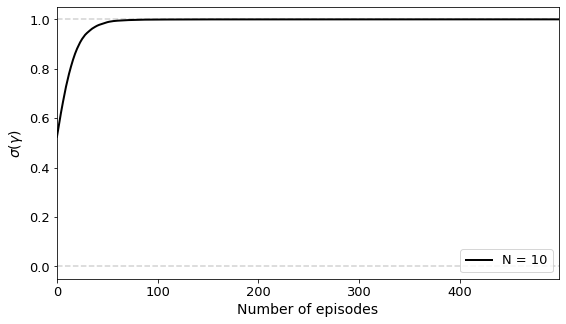

In [14]:
alphas = np.asarray([frame.sig_alpha for frame in alpha_frames])

fig = plt.figure(figsize=(9, 5))
ax = plt.subplot(1, 1, 1)

ax.tick_params(axis='both', which='major', labelsize=13)
ax.axhline(1, c='lightgray', ls='--')
ax.axhline(0, c='lightgray', ls='--')
ax.plot(alphas, lw=2, color='k', label='N = {0}'.format(10))

ax.set_xlim([0, opt.ALPHA_NUM_ITER - 1])
ax.set_xlabel('Number of episodes', fontsize=14)
ax.set_ylabel(r'$\sigma(\gamma)$', fontsize=14)
ax.legend(loc=4, prop={'size': 13})

plt.show()

### Experimento 3: Aprendizaje de encoder

In [33]:
import torch
import torch.nn as nn
import torch.nn.functional as F

from scipy import interpolate

import random
from tqdm.notebook import tqdm, trange
from copy import deepcopy
from argparse import Namespace
import warnings

import seaborn as sns
sns.set()

In [8]:
#from causal_meta.modules import networks as nets
sys.path.insert(1, str(repo / "causal_meta" / "utils"))
sys.path.insert(1, str(repo / "causal_meta" / "modules"))

import train_utils as tu
from encoder import Rotor
from mdn import MDN, GMM, mdn_nll
from gmm import GaussianMixture

In [9]:
SEED = 91023
torch.manual_seed(SEED)
np.random.seed(SEED)

#### Boilerplate

##### Utilities

In [10]:
def normal(mean, std, N): 
    return torch.normal(torch.ones(N).mul_(mean), torch.ones(N).mul_(std)).view(-1, 1)

def normal_like(X): 
    mean = X.mean()
    std = X.std()
    return normal(mean, std, X.size(0))

def mlp(opt): 
    if opt.NUM_MID_LAYERS == -1: 
        return nn.Linear(opt.INP_DIM, opt.OUT_DIM)
    else:
        return nets.MLP(opt.INP_DIM, opt.OUT_DIM, opt.NUM_MID_LAYERS, 
                        opt.CAPACITY, opt.INP_NOISE)

##### Mixture Density

In [11]:
def mdn(opt): 
    return MDN(opt.CAPACITY, opt.NUM_COMPONENTS)

def gmm(opt): 
    return GaussianMixture(opt.GMM_NUM_COMPONENTS)

##### Reversible Encoder

In [12]:
def xcodergen(opt): 
    # Make rotor
    return Rotor(opt.XCODER_INIT)

##### Ground Truth Generator

We use a posterior of the form: 

$$
P(Y | X) = \sum_i \pi_i(X) \mathcal{N}(\mu_i(X), \sigma_i(X))
$$

which is a mixture of 10 gaussians. 

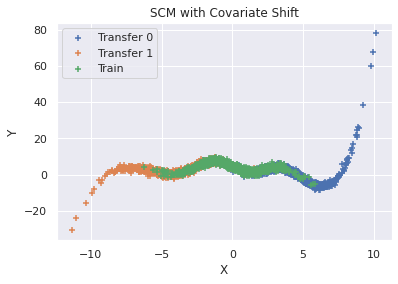

In [13]:
# Test
rand_scm = RandomSplineSCM(False, True, 8, 8, 3, range_scale=1.)

plt.figure()
plt.title("SCM with Covariate Shift")
rand_scm.plot(X=normal(4, 2, 1000), show=False, label='Transfer 0')
rand_scm.plot(X=normal(-4, 2, 1000), show=False, label='Transfer 1')
rand_scm.plot(X=normal(0, 2, 1000), show=False, label='Train')
plt.xlabel("X")
plt.ylabel("Y")
plt.legend()
plt.show()

##### Visualization

In [14]:
def plot_key(frames, key, show=True, label=None, name=None): 
    its, vals = zip(*[(frame.iter_num, getattr(frame, key)) for frame in frames])
    if show:
        plt.figure()
    plt.plot(its, vals, label=label)
    if show:
        plt.xlabel("Iterations")
        plt.ylabel(name if name is not None else key.title())
        plt.show()

##### Training

In [15]:
def gradnan_filter(model): 
    nan_found = False
    for p in model.parameters(): 
        nan_mask = torch.isnan(p.grad.data)
        nan_found = bool(nan_mask.any().item())
        p.grad.data[nan_mask] = 0.
    return nan_found

In [16]:
def marginal_nll(opt, inp, nll): 
    model_g = gmm(opt)
    if opt.CUDA: 
        model_g = model_g.cuda()
    model_g.fit(inp, n_iter=opt.EM_ITERS)
    with torch.no_grad():
        loss_marginal = nll(model_g(inp), inp)
    return loss_marginal

In [34]:
def encoder_train_shared_regret(opt, model_x2y, model_y2x, scm, encoder, decoder, alpha): 
    if opt.CUDA: 
        model_x2y = model_x2y.cuda()
        model_y2x = model_y2x.cuda()
        encoder = encoder.cuda()
        decoder = decoder.cuda()
    encoder_optim = torch.optim.Adam(encoder.parameters(), opt.ENCODER_LR)
    alpha_optim = torch.optim.Adam([alpha], opt.ALPHA_LR)
    frames = []
    for meta_iter in trange(opt.NUM_META_ITER): 
        # Preheat the models
        _ = tu.train_nll(opt, model_x2y, scm, opt.TRAIN_DISTRY, 'X2Y', 
                         mdn_nll, decoder, encoder)
        _ = tu.train_nll(opt, model_y2x, scm, opt.TRAIN_DISTRY, 'Y2X', 
                         mdn_nll, decoder, encoder)
        # Sample from SCM
        X = opt.TRANS_DISTRY()
        Y = scm(X)
        if opt.CUDA: 
            X, Y = X.cuda(), Y.cuda()
        # Decode 
        with torch.no_grad(): 
            X, Y = decoder(X, Y)
        # Encode
        X, Y = encoder(X, Y)
        with torch.no_grad():
            if opt.USE_BASELINE:
                baseline_y = marginal_nll(opt, Y, mdn_nll)
                baseline_x = marginal_nll(opt, X, mdn_nll)
            else:
                baseline_y = 0.
                baseline_x = 0.
        # Save state dicts
        state_x2y = deepcopy(model_x2y.state_dict())
        state_y2x = deepcopy(model_y2x.state_dict())
        # Inner loop 
        optim_x2y = torch.optim.Adam(model_x2y.parameters(), lr=opt.FINETUNE_LR)
        optim_y2x = torch.optim.Adam(model_y2x.parameters(), lr=opt.FINETUNE_LR)
        regrets_x2y = []
        regrets_y2x = []
        is_nan = False
        # Evaluate regret discrepancy 
        for t in range(opt.FINETUNE_NUM_ITER):
            loss_x2y = mdn_nll(model_x2y(X), Y)
            loss_y2x = mdn_nll(model_y2x(Y), X)
            if torch.isnan(loss_x2y).item() or torch.isnan(loss_y2x).item(): 
                is_nan = True
                break
            optim_x2y.zero_grad()
            optim_y2x.zero_grad()
            loss_x2y.backward(retain_graph=True) 
            loss_y2x.backward(retain_graph=True)
            # Filter out NaNs that might have sneaked in
            nan_in_x2y = gradnan_filter(model_x2y)
            nan_in_y2x = gradnan_filter(model_y2x)
            if nan_in_x2y or nan_in_y2x: 
                is_nan = True
                break
            optim_x2y.step()
            optim_y2x.step()
            # Store for encoder
            regrets_x2y.append(loss_x2y + baseline_x)
            regrets_y2x.append(loss_y2x + baseline_y)
        if not is_nan:
            # Evaluate total regret
            regret_x2y = torch.stack(regrets_x2y).mean()
            regret_y2x = torch.stack(regrets_y2x).mean()
            # Evaluate losses
            loss = torch.logsumexp(
                torch.stack([F.logsigmoid(alpha) + regret_x2y,
                             F.logsigmoid(-alpha) + regret_y2x]), 
                0)
            # Optimize
            encoder_optim.zero_grad()
            alpha_optim.zero_grad()
            loss.backward()
            # Make sure no nans
            if torch.isnan(encoder.theta.grad.data).any(): 
                encoder.theta.grad.data.zero_()
            if torch.isnan(alpha.grad.data).any(): 
                alpha.grad.data.zero_()
            encoder_optim.step()
            alpha_optim.step()
            # Load original state dicts
            model_x2y.load_state_dict(state_x2y)
            model_y2x.load_state_dict(state_y2x)
            # Add info
            frames.append(Namespace(iter_num=meta_iter, 
                                    regret_x2y=regret_x2y.item(), 
                                    regret_y2x=regret_y2x.item(),
                                    loss=loss.item(),
                                    alpha=alpha.item(), 
                                    theta=encoder.theta.item()))
        else:
            # Load original state dicts
            model_x2y.load_state_dict(state_x2y)
            model_y2x.load_state_dict(state_y2x)
            # Add dummy info
            frames.append(Namespace(iter_num=meta_iter, 
                                    regret_x2y=float('nan'), 
                                    regret_y2x=float('nan'),
                                    loss=float('nan'),
                                    alpha=float('nan'), 
                                    theta=float('nan')))
            
    return frames

In [35]:
def plot_theta(frames, gt_theta, save=False): 
    its, vals = zip(*[(frame.iter_num, frame.theta / (np.pi / 2)) for frame in frames])
    gt_theta = -gt_theta.item() / (np.pi / 2)
    plt.figure()
    # plt.plot(its, vals, label=r'$\theta_{\mathcal{E}}$', c='black')
    plt.plot(its, vals, label=r'$\theta_{\mathcal{E}}$')
    plt.plot(its, [gt_theta] * len(its), linestyle='--', label=r'Solution 1 $\left(+\frac{\pi}{4}\right)$')
    plt.plot(its, [gt_theta - 1] * len(its), linestyle='--', label=r'Solution 2 $\left(-\frac{\pi}{4}\right)$')
    plt.xlabel("Iterations")
    plt.ylabel("Encoder Angle [π/2 rad]")
    plt.legend()
    if save:
        plt.savefig('fixed-encoder-evo.pdf', bbox_inches='tight', format='pdf')
    plt.show()

In [36]:
def probe_xcoders(encoder, decoder):
    # Test encoder and decoder
    with torch.no_grad():
        _X = torch.tensor([[1.]])
        _Y = torch.tensor([[0.]])
        if opt.CUDA:
            _X, _Y = _X.to(encoder.theta.device), _Y.to(encoder.theta.device)
        _X_d, _Y_d = decoder(_X, _Y)
        _X_de, _Y_de = encoder(_X_d, _Y_d)
    print(f"Initial (A, B) = {_X.item()}, {_Y.item()}")
    print(f"Decoded (X, Y) = {_X_d.item()}, {_Y_d.item()}")
    print(f"Encoded (U, V) = {_X_de.item()}, {_Y_de.item()}")

#### Experiments with Unfixed Encoders

In [20]:
opt = Namespace()

# Model
opt.CAPACITY = 32
opt.NUM_COMPONENTS = 10
opt.GMM_NUM_COMPONENTS = 10

# Training
opt.LR = 0.01
opt.NUM_ITER = 20
opt.NUM_META_ITER = 1000
opt.ENCODER_LR = 0.01
opt.ALPHA_LR = 0.001
opt.CUDA = True
opt.REC_FREQ = 10
opt.ALPHA_INIT = 0.
opt.USE_BASELINE = True

# Fine tuning
opt.FINETUNE_NUM_ITER = 5
opt.FINETUNE_LR = 0.001
opt.EM_ITERS = 500

# Sampling 
opt.NUM_SAMPLES = 1000
opt.TRAIN_DISTRY = lambda: normal(0, 2, opt.NUM_SAMPLES)
opt.TRANS_DISTRY = lambda: normal(np.random.uniform(-4, 4), 
                                  2, opt.NUM_SAMPLES)

# Encoder
opt.DECODER_DEFAULT = -float(0.5 * np.pi/2)

##### Make Xcoders

Make a ground-truth decoder with $\theta_0$. 

In [21]:
gt_decoder = Rotor(opt.DECODER_DEFAULT)

The real encoder should have $\theta = -\theta_0$. 

In [22]:
encoder = Rotor(0. * np.pi/2)

In [23]:
probe_xcoders(encoder, gt_decoder)

Initial (A, B) = 1.0, 0.0
Decoded (X, Y) = 0.7071067690849304, 0.7071067690849304
Encoded (U, V) = 0.7071067690849304, 0.7071067690849304


##### Make Alpha and Models

In [24]:
alpha = tu.make_alpha(opt)

In [25]:
model_x2y = mdn(opt)
model_y2x = mdn(opt)

##### Train Encoder

If it doesn't work with the seed of your choice, try tuning the (hyper)parameters of ```opt.TRANS_DISTRY```. Since the SCM is generated randomly, it's not possible to know the correct hyper-parameters in advance (unless the seed is fixed). $\sigma \in (1, 2)$ should work fine, but if the range from which the means are sampled is too large, you can have numerical instabilities. If it's too small, the gradient signal to the encoder can be weak. 

In [37]:
frames = encoder_train_shared_regret(opt, model_x2y, model_y2x, rand_scm, encoder, gt_decoder, alpha)

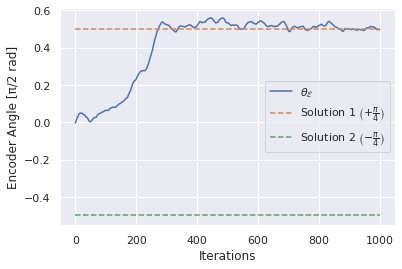

In [38]:
plot_theta(frames, gt_decoder.theta)

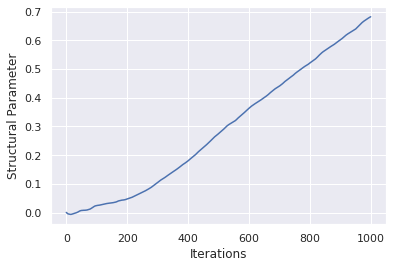

In [39]:
plot_key(frames, 'alpha', name='Structural Parameter')